In [ ]:
"""
================================================================================
INTERPRETABLE AI FOR DIABETIC RETINOPATHY DETECTION
Environment setup
================================================================================

This project was developed and run on Kaggle, where the IDRiD dataset was
mounted read-only at /kaggle/input/... and outputs were written to
/kaggle/working/. Every other cell in this notebook now reads two
configurable paths instead, so the whole pipeline runs unchanged on any
machine (local, Colab, a GitHub Codespace, etc.):

  IDRID_ROOT  - folder containing the IDRiD dataset
                (holds the "A. Segmentation" and "B. Disease Grading" folders)
  OUTPUT_DIR  - folder where checkpoints, CSVs, and figures are written

Both default to relative paths under the current working directory and can
be overridden with environment variables if your data lives elsewhere:

    export IDRID_ROOT=/path/to/idrid-dataset
    export OUTPUT_DIR=/path/to/outputs

Get the IDRiD dataset from the official source
(https://idrid.grand-challenge.org/Data/) or the Kaggle mirror this project
used (https://www.kaggle.com/datasets/onkarramdin/idrid-dataset), and place
it under data/idrid-dataset/ so the folder structure looks like:

    data/idrid-dataset/
      A. Segmentation/A. Segmentation/...
      B. Disease Grading/B. Disease Grading/...
================================================================================
"""

import os

IDRID_ROOT = os.environ.get("IDRID_ROOT", os.path.join("data", "idrid-dataset"))
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "outputs")
os.makedirs(OUTPUT_DIR, exist_ok=True)

print(f"IDRID_ROOT -> {os.path.abspath(IDRID_ROOT)}")
print(f"OUTPUT_DIR -> {os.path.abspath(OUTPUT_DIR)}")

if not os.path.isdir(IDRID_ROOT):
    print("\nWARNING: IDRID_ROOT does not exist yet. Download the IDRiD dataset")
    print("and place it there (see the comment above) before running the rest")
    print("of this notebook.")


In [ ]:
!pip install grad-cam captum --quiet

INTERPRETABLE AI FOR DIABETIC RETINOPATHY DETECTION
Device: cuda

PHASE 1: manifest built - 516 images
dr_grade
0    168
1     25
2    168
3     93
4     62

Splits - train: 361, val: 77, test: 78

PHASE 2: class weights (inverse frequency)
  No_DR              n=118  weight=0.612
  Mild_NPDR          n= 17  weight=4.247
  Moderate_NPDR      n=118  weight=0.612
  Severe_NPDR        n= 65  weight=1.111
  Proliferative_DR   n= 43  weight=1.679

Found existing checkpoint - loading instead of retraining.
  (delete /kaggle/working/best_model.pth to force a fresh train)

--- Test set evaluation ---
Test loss 1.1733  accuracy 0.4744
                  precision    recall  f1-score   support

           No_DR       0.65      0.68      0.67        25
       Mild_NPDR       0.07      0.25      0.11         4
   Moderate_NPDR       0.64      0.28      0.39        25
     Severe_NPDR       0.50      0.64      0.56        14
Proliferative_DR       0.33      0.30      0.32        10

        accuracy

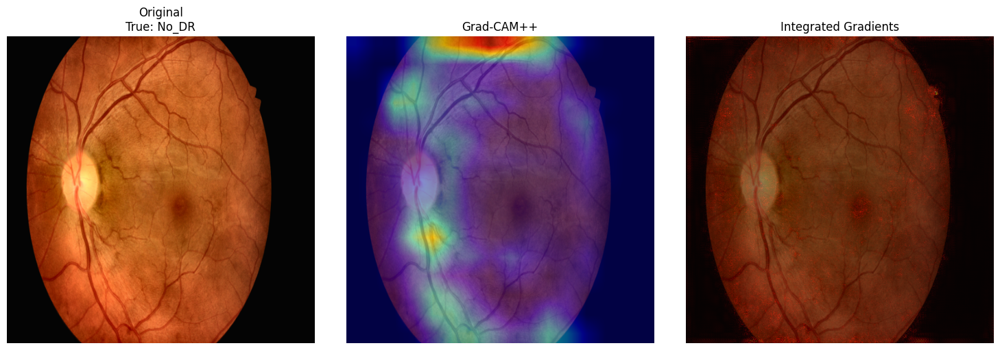

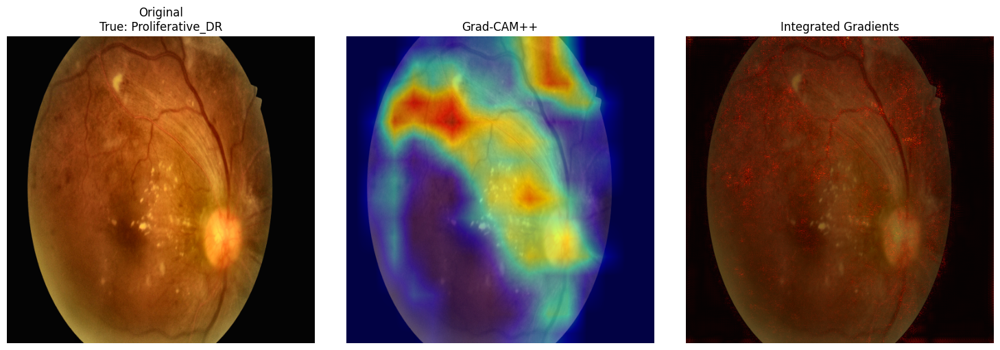

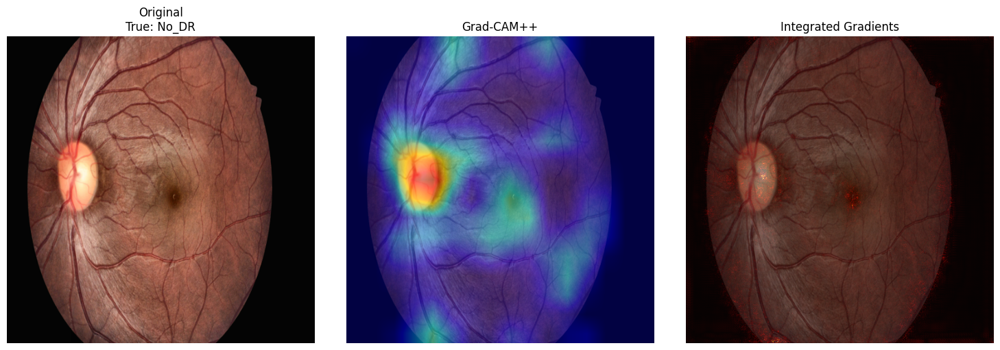

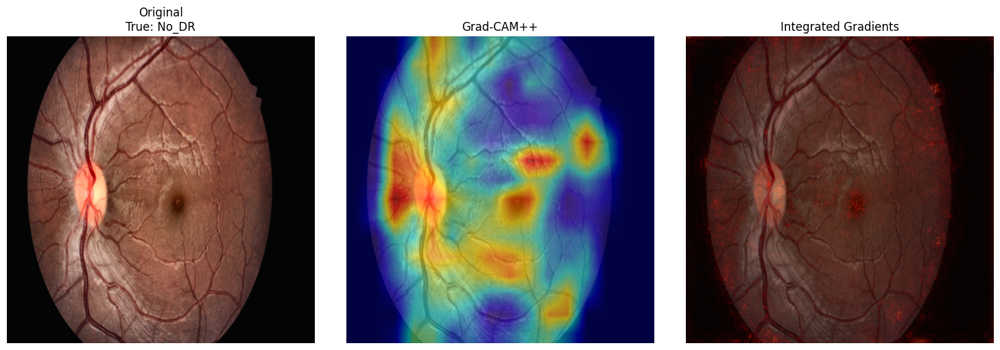

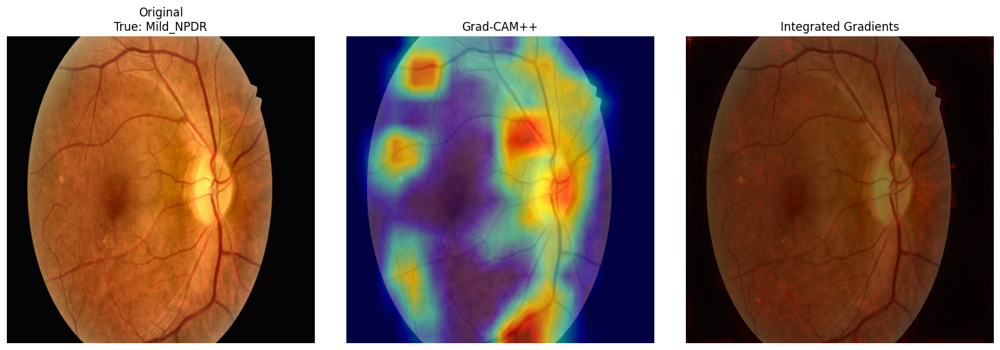

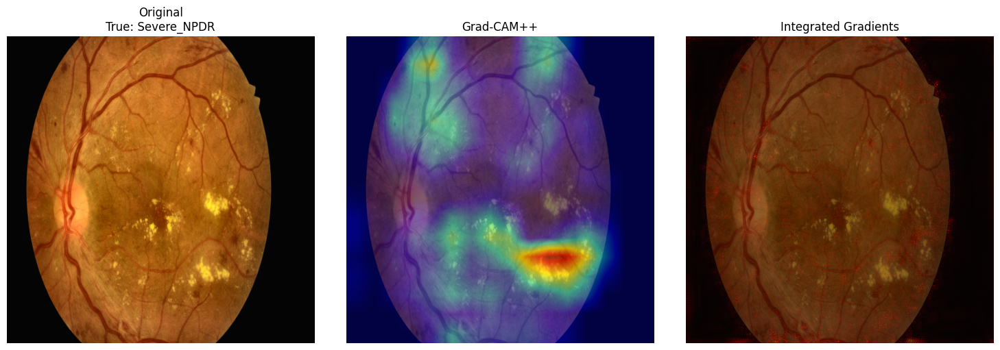

  saved 6 saliency figures to /kaggle/working/

PHASE 4: segmentation manifest - 81 images with lesion masks
  training-set overlap (by pixel content): 43 of 81 images
  clean/unseen: 38

  running verification on 81 images...
    20/81
    40/81
    60/81
    80/81

RESULTS: spatial alignment of saliency with expert lesion annotations

[ALL segmentation images]  n = 81
  chance IoU floor          0.0193
  Grad-CAM++   IoU 0.0304  DSC 0.0574  lift 1.60x
  Int.Grads    IoU 0.0243  DSC 0.0463  lift 1.34x

[CLEAN - unseen by model (cite this)]  n = 38
  chance IoU floor          0.0211
  Grad-CAM++   IoU 0.0318  DSC 0.0598  lift 1.46x
  Int.Grads    IoU 0.0254  DSC 0.0486  lift 1.39x

[LEAKED - also in training split]  n = 43
  chance IoU floor          0.0177
  Grad-CAM++   IoU 0.0293  DSC 0.0554  lift 1.71x
  Int.Grads    IoU 0.0233  DSC 0.0443  lift 1.29x

--- Gaze-drift check (each vs its own chance floor) ---
  vs lesions:    IoU 0.0318  chance 0.0211  lift 1.46x
  vs optic disc: IoU

In [5]:
"""
================================================================================
INTERPRETABLE AI FOR DIABETIC RETINOPATHY DETECTION
Consolidated end-to-end pipeline - Onkar Ramdin, MS Data Science
================================================================================

Runs top to bottom in a single Kaggle notebook cell. No __main__ guards, no
cross-file imports, no dependence on state from previous cells. If the kernel
restarts, rerun this one cell and everything rebuilds.

PIPELINE:
  Phase 1  Data ingestion + clinical preprocessing (CLAHE, FOV masking)
  Phase 2  EfficientNet-B0 training with class-weighted loss
  Phase 3  Post-hoc XAI: Grad-CAM++ and Integrated Gradients
  Phase 4  Quantitative verification: IoU/DSC vs expert lesion masks

SETUP (run once in a separate cell before this):
  !pip install grad-cam captum --quiet
  Enable Settings > Internet ON (needed for pretrained weights download)

DESIGN DECISIONS AND WHY (for the methodology chapter):

  * IDRiD only, Messidor-2 excluded. The Messidor-2 CSV available for this
    project contained only left/right eye pairing per patient, with no DR
    severity grade column - it cannot supply classification labels.

  * Single backbone (EfficientNet-B0), frozen, not a multi-architecture
    comparison. With 516 images one well-tuned model is more defensible than
    three rushed ones.

  * Class-weighted loss. IDRiD grade distribution is {0:168, 1:25, 2:168,
    3:93, 4:62}. Mild NPDR at n=25 would otherwise never be predicted.

  * XAI verification runs on the 81-image segmentation subset DIRECTLY, not
    on the classification test split. IDRiD's segmentation and disease-grading
    subsets use INDEPENDENT filename numbering - verified empirically by pixel
    comparison - so no cross-set mapping exists. Measuring explanation
    faithfulness needs only image + saliency + lesion mask, not the severity
    label, so this decoupling is both necessary and statistically better
    (n=81 rather than n~12).

  * Chance baseline computed per image. At a 75th-percentile threshold ~25%
    of pixels are flagged as attention while lesions cover ~1-3% of the image,
    so random attention scores a nonzero IoU by construction. Raw IoU without
    this floor is uninterpretable.
================================================================================
"""

import os
import re
import gc
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from captum.attr import IntegratedGradients

# ==============================================================================
# CONFIGURATION
# ==============================================================================

IDRID_ROOT = os.environ.get("IDRID_ROOT", os.path.join("data", "idrid-dataset"))
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "outputs")
os.makedirs(OUTPUT_DIR, exist_ok=True)

GRADING_ROOT = os.path.join(IDRID_ROOT, "B. Disease Grading/B. Disease Grading")
GRADING_TRAIN_CSV = os.path.join(GRADING_ROOT, "2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv")
GRADING_TEST_CSV = os.path.join(GRADING_ROOT, "2. Groundtruths/b. IDRiD_Disease Grading_Testing Labels.csv")
GRADING_TRAIN_IMAGES = os.path.join(GRADING_ROOT, "1. Original Images/a. Training Set")
GRADING_TEST_IMAGES = os.path.join(GRADING_ROOT, "1. Original Images/b. Testing Set")

SEG_ROOT = os.path.join(IDRID_ROOT, "A. Segmentation/A. Segmentation")
SEG_SPLITS = {
    "seg_train": (
        os.path.join(SEG_ROOT, "1. Original Images/a. Training Set"),
        os.path.join(SEG_ROOT, "2. All Segmentation Groundtruths/a. Training Set"),
    ),
    "seg_test": (
        os.path.join(SEG_ROOT, "1. Original Images/b. Testing Set"),
        os.path.join(SEG_ROOT, "2. All Segmentation Groundtruths/b. Testing Set"),
    ),
}
LESION_SUBFOLDERS = {
    "microaneurysms": "1. Microaneurysms",
    "haemorrhages": "2. Haemorrhages",
    "hard_exudates": "3. Hard Exudates",
    "soft_exudates": "4. Soft Exudates",
}
OPTIC_DISC_SUBFOLDER = "5. Optic Disc"

CHECKPOINT_PATH = os.path.join(OUTPUT_DIR, "best_model.pth")

IMAGE_SIZE = 512
BATCH_SIZE = 16
NUM_EPOCHS = 15
LEARNING_RATE = 1e-3
NUM_CLASSES = 5
RANDOM_SEED = 42
PERCENTILE = 75
N_RANDOM_TRIALS = 20
LEAKAGE_MAD_THRESHOLD = 5.0
N_QUALITATIVE_SAMPLES = 6

DR_CLASSES = {
    0: "No_DR", 1: "Mild_NPDR", 2: "Moderate_NPDR",
    3: "Severe_NPDR", 4: "Proliferative_DR",
}

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print("=" * 78)
print("INTERPRETABLE AI FOR DIABETIC RETINOPATHY DETECTION")
print("=" * 78)
print(f"Device: {DEVICE}")


# ==============================================================================
# PHASE 1: DATA INGESTION AND CLINICAL PREPROCESSING
# ==============================================================================

def apply_clahe(image_bgr, clip_limit=2.0, tile_grid_size=(8, 8)):
    """CLAHE on the L channel of LAB - enhances local contrast so
    microaneurysms and haemorrhages stand out, without distorting colour."""
    lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return cv2.cvtColor(cv2.merge((clahe.apply(l), a, b)), cv2.COLOR_LAB2BGR)


def circular_fov_mask(image_bgr, threshold=10):
    """Masks everything outside the circular fundus field of view, removing
    black corners and camera edge artefacts that models can latch onto."""
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return image_bgr
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, [max(contours, key=cv2.contourArea)], -1, 255, thickness=cv2.FILLED)
    return cv2.bitwise_and(image_bgr, image_bgr, mask=mask)


def preprocess_image(image_path, output_size=IMAGE_SIZE):
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")
    img = circular_fov_mask(img)
    img = apply_clahe(img)
    img = cv2.resize(img, (output_size, output_size), interpolation=cv2.INTER_AREA)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def extract_numeric_id(filename):
    m = re.search(r"IDRiD_0*(\d+)", str(filename))
    return int(m.group(1)) if m else None


def build_idrid_manifest():
    train = pd.read_csv(GRADING_TRAIN_CSV)
    test = pd.read_csv(GRADING_TEST_CSV)

    train = train.rename(columns={train.columns[0]: "image_id", train.columns[1]: "dr_grade"})
    test = test.rename(columns={test.columns[0]: "image_id", test.columns[1]: "dr_grade"})

    train["image_path"] = train["image_id"].apply(lambda x: os.path.join(GRADING_TRAIN_IMAGES, f"{x}.jpg"))
    test["image_path"] = test["image_id"].apply(lambda x: os.path.join(GRADING_TEST_IMAGES, f"{x}.jpg"))
    train["source_split"] = "train"
    test["source_split"] = "test"

    combined = pd.concat([train[["image_id", "dr_grade", "image_path", "source_split"]],
                          test[["image_id", "dr_grade", "image_path", "source_split"]]],
                         ignore_index=True)
    combined["dr_grade"] = combined["dr_grade"].astype(int)

    exists = combined["image_path"].apply(lambda p: Path(p).exists())
    if (~exists).sum():
        print(f"  dropping {(~exists).sum()} rows with missing image files")
    combined = combined[exists].reset_index(drop=True)

    print(f"\nPHASE 1: manifest built - {len(combined)} images")
    print(combined["dr_grade"].value_counts().sort_index().to_string())
    return combined


class DRDataset(Dataset):
    def __init__(self, manifest_df, transform=None):
        self.manifest = manifest_df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.manifest)

    def __getitem__(self, idx):
        row = self.manifest.iloc[idx]
        image = preprocess_image(row["image_path"])
        label = int(row["dr_grade"])
        if self.transform:
            image = self.transform(Image.fromarray(image))
        else:
            image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        return image, label


train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
eval_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

idrid_manifest = build_idrid_manifest()

train_df, temp_df = train_test_split(
    idrid_manifest, test_size=0.3, stratify=idrid_manifest["dr_grade"], random_state=RANDOM_SEED)
val_df, test_df = train_test_split(
    temp_df, test_size=0.5, stratify=temp_df["dr_grade"], random_state=RANDOM_SEED)
print(f"\nSplits - train: {len(train_df)}, val: {len(val_df)}, test: {len(test_df)}")

train_loader = DataLoader(DRDataset(train_df, train_transform), batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(DRDataset(val_df, eval_transform), batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(DRDataset(test_df, eval_transform), batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


# ==============================================================================
# PHASE 2: MODEL TRAINING
# ==============================================================================

def compute_class_weights(manifest_df, num_classes=NUM_CLASSES):
    counts = manifest_df["dr_grade"].value_counts().sort_index().reindex(range(num_classes), fill_value=1)
    weights = counts.sum() / (num_classes * counts)
    print("\nPHASE 2: class weights (inverse frequency)")
    for c, w in zip(range(num_classes), weights):
        print(f"  {DR_CLASSES[c]:18s} n={counts[c]:3d}  weight={w:.3f}")
    return torch.tensor(weights.values, dtype=torch.float32)


def build_model(num_classes=NUM_CLASSES, freeze_backbone=True, pretrained=True):
    weights = models.EfficientNet_B0_Weights.IMAGENET1K_V1 if pretrained else None
    model = models.efficientnet_b0(weights=weights)
    if freeze_backbone:
        for p in model.features.parameters():
            p.requires_grad = False
    in_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(nn.Dropout(p=0.3), nn.Linear(in_features, num_classes))
    return model.to(DEVICE)


def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total


@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    preds, labels_all, probs_all = [], [], []
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        outputs = model(images)
        running_loss += criterion(outputs, labels).item() * images.size(0)
        probs_all.extend(torch.softmax(outputs, 1).cpu().numpy())
        preds.extend(outputs.argmax(1).cpu().numpy())
        labels_all.extend(labels.cpu().numpy())
    acc = np.mean(np.array(preds) == np.array(labels_all))
    return running_loss / len(labels_all), acc, preds, labels_all, probs_all


class_weights = compute_class_weights(train_df).to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights)

if os.path.exists(CHECKPOINT_PATH):
    print(f"\nFound existing checkpoint - loading instead of retraining.")
    print(f"  (delete {CHECKPOINT_PATH} to force a fresh train)")
    model = build_model(pretrained=False)
    model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=DEVICE))
    model.eval()
else:
    print("\nNo checkpoint found - training from scratch.")
    model = build_model(pretrained=True)
    optimizer = optim.Adam(model.classifier.parameters(), lr=LEARNING_RATE)

    best_val_f1 = 0.0
    for epoch in range(NUM_EPOCHS):
        tr_loss, tr_acc = train_one_epoch(model, train_loader, criterion, optimizer)
        v_loss, v_acc, v_preds, v_labels, _ = evaluate(model, val_loader, criterion)
        v_f1 = f1_score(v_labels, v_preds, average="macro")
        print(f"  epoch {epoch+1:2d}/{NUM_EPOCHS}  train_loss {tr_loss:.4f} acc {tr_acc:.4f} | "
              f"val_loss {v_loss:.4f} acc {v_acc:.4f} macroF1 {v_f1:.4f}")
        if v_f1 > best_val_f1:
            best_val_f1 = v_f1
            torch.save(model.state_dict(), CHECKPOINT_PATH)
    model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=DEVICE))

print("\n--- Test set evaluation ---")
t_loss, t_acc, t_preds, t_labels, t_probs = evaluate(model, test_loader, criterion)
print(f"Test loss {t_loss:.4f}  accuracy {t_acc:.4f}")
print(classification_report(t_labels, t_preds,
                            target_names=[DR_CLASSES[i] for i in range(NUM_CLASSES)],
                            zero_division=0))
print(f"Macro F1: {f1_score(t_labels, t_preds, average='macro'):.4f}")
try:
    auc = roc_auc_score(label_binarize(t_labels, classes=list(range(NUM_CLASSES))),
                        t_probs, average="macro", multi_class="ovr")
    print(f"Macro ROC-AUC (OvR): {auc:.4f}")
except ValueError as e:
    print(f"ROC-AUC unavailable: {e}")


# ==============================================================================
# PHASE 3: POST-HOC XAI
# ==============================================================================

target_layers = [model.features[-1]]


def generate_gradcam(model, target_layers, image_tensor, target_class):
    """A fresh CAM instance per call, released via context manager. Reusing one
    instance across images leaks GPU memory through its retained hooks.
    requires_grad_(True) on the input is mandatory even with a frozen backbone -
    without it autograd builds no graph and the hooks capture None."""
    inp = image_tensor.unsqueeze(0).clone().detach().requires_grad_(True)
    with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
        out = cam(input_tensor=inp, targets=[ClassifierOutputTarget(target_class)])
    return out[0]


def generate_integrated_gradients(model, image_tensor, target_class, n_steps=30):
    """internal_batch_size caps simultaneous interpolation steps on the GPU."""
    ig = IntegratedGradients(model)
    inp = image_tensor.unsqueeze(0).to(DEVICE).requires_grad_()
    attr = ig.attribute(inp, target=target_class, n_steps=n_steps,
                        internal_batch_size=10, baselines=torch.zeros_like(inp))
    result = attr.squeeze(0).cpu().detach().numpy().transpose(1, 2, 0)
    del attr, inp
    return result


def denormalize(t):
    img = t.cpu().numpy().transpose(1, 2, 0) * np.array(IMAGENET_STD) + np.array(IMAGENET_MEAN)
    return np.clip(img, 0, 1)


print(f"\nPHASE 3: generating qualitative saliency maps "
      f"({N_QUALITATIVE_SAMPLES} correctly-classified samples)")

qualitative = []
count = 0
for images, labels in test_loader:
    images = images.to(DEVICE)
    with torch.no_grad():
        preds = model(images).argmax(1)
    for i in range(images.size(0)):
        if count >= N_QUALITATIVE_SAMPLES:
            break
        if labels[i].item() != preds[i].item():
            continue
        true_l, pred_l = labels[i].item(), preds[i].item()
        rgb = denormalize(images[i])
        gc_map = generate_gradcam(model, target_layers, images[i], pred_l)
        ig_map = np.abs(generate_integrated_gradients(model, images[i].cpu(), pred_l)).sum(axis=2)
        ig_map /= (ig_map.max() + 1e-8)

        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(rgb); ax[0].set_title(f"Original\nTrue: {DR_CLASSES[true_l]}"); ax[0].axis("off")
        ax[1].imshow(show_cam_on_image(rgb, gc_map, use_rgb=True)); ax[1].set_title("Grad-CAM++"); ax[1].axis("off")
        ax[2].imshow(rgb); ax[2].imshow(ig_map, cmap="hot", alpha=0.5)
        ax[2].set_title("Integrated Gradients"); ax[2].axis("off")
        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_DIR, f"saliency_sample_{count}.png"), dpi=100, bbox_inches="tight")
        plt.show(); plt.close(fig)
        qualitative.append({"true": true_l, "pred": pred_l})
        count += 1
        torch.cuda.empty_cache(); gc.collect()
    if count >= N_QUALITATIVE_SAMPLES:
        break
print(f"  saved {count} saliency figures to {OUTPUT_DIR}/")


# ==============================================================================
# PHASE 4: QUANTITATIVE VERIFICATION (IoU / DSC)
# ==============================================================================

def build_segmentation_manifest():
    records = []
    for split_name, (images_dir, masks_root) in SEG_SPLITS.items():
        for img_file in sorted(os.listdir(images_dir)):
            nid = extract_numeric_id(img_file)
            if nid is None:
                continue
            mask_paths = {}
            for lesion_name, sub in LESION_SUBFOLDERS.items():
                d = os.path.join(masks_root, sub)
                if not os.path.isdir(d):
                    continue
                hits = [f for f in os.listdir(d) if extract_numeric_id(f) == nid]
                if hits:
                    mask_paths[lesion_name] = os.path.join(d, hits[0])
            od_dir = os.path.join(masks_root, OPTIC_DISC_SUBFOLDER)
            od_hits = [f for f in os.listdir(od_dir) if extract_numeric_id(f) == nid] if os.path.isdir(od_dir) else []
            if mask_paths:
                records.append({
                    "seg_id": f"IDRiD_{nid:02d}",
                    "seg_split": split_name,
                    "image_path": os.path.join(images_dir, img_file),
                    "mask_paths": mask_paths,
                    "od_mask_path": os.path.join(od_dir, od_hits[0]) if od_hits else None,
                })
    df = pd.DataFrame(records)
    print(f"\nPHASE 4: segmentation manifest - {len(df)} images with lesion masks")
    return df


def thumbs(paths, size=64):
    out = {}
    for p in paths:
        im = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if im is not None:
            out[p] = cv2.resize(im, (size, size)).astype(np.float32)
    return out


def detect_training_overlap(seg_df, train_df, threshold=LEAKAGE_MAD_THRESHOLD):
    """IDRiD's segmentation and disease-grading subsets number independently,
    so overlap must be detected by pixel content, never by filename."""
    seg_t = thumbs(seg_df["image_path"].tolist())
    tr_t = thumbs(train_df["image_path"].tolist())
    tr_paths = list(tr_t.keys())
    stack = np.stack([tr_t[p] for p in tr_paths])

    flags = []
    for _, row in seg_df.iterrows():
        th = seg_t.get(row["image_path"])
        if th is None:
            flags.append(False); continue
        flags.append(float(np.abs(stack - th).mean(axis=(1, 2)).min()) < threshold)

    seg_df = seg_df.reset_index(drop=True).copy()
    seg_df["in_training"] = flags
    print(f"  training-set overlap (by pixel content): {sum(flags)} of {len(seg_df)} images")
    print(f"  clean/unseen: {len(seg_df) - sum(flags)}")
    return seg_df


def load_binary_mask(path, size=IMAGE_SIZE):
    if path is None:
        return np.zeros((size, size), dtype=np.uint8)
    m = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if m is None:
        return np.zeros((size, size), dtype=np.uint8)
    return (cv2.resize(m, (size, size), interpolation=cv2.INTER_NEAREST) > 0).astype(np.uint8)


def combined_lesion_mask(mask_paths, size=IMAGE_SIZE):
    out = np.zeros((size, size), dtype=np.uint8)
    for p in mask_paths.values():
        out = np.logical_or(out, load_binary_mask(p, size)).astype(np.uint8)
    return out


def binarize(smap, pct=PERCENTILE):
    return (smap >= np.percentile(smap, pct)).astype(np.uint8)


def iou(a, b):
    u = np.logical_or(a, b).sum()
    return np.nan if u == 0 else np.logical_and(a, b).sum() / u


def dsc(a, b):
    t = a.sum() + b.sum()
    return np.nan if t == 0 else 2 * np.logical_and(a, b).sum() / t


def chance_iou(mask, n_attention, trials=N_RANDOM_TRIALS):
    h, w = mask.shape
    tot = h * w
    vals = []
    for _ in range(trials):
        flat = np.zeros(tot, dtype=np.uint8)
        flat[np.random.choice(tot, size=int(n_attention), replace=False)] = 1
        vals.append(iou(flat.reshape(h, w), mask))
    return np.nanmean(vals)


seg_manifest = detect_training_overlap(build_segmentation_manifest(), train_df)

print(f"\n  running verification on {len(seg_manifest)} images...")
rows = []
for i, (_, r) in enumerate(seg_manifest.iterrows(), 1):
    if i % 20 == 0:
        print(f"    {i}/{len(seg_manifest)}")
    tensor = eval_transform(Image.fromarray(preprocess_image(r["image_path"])))
    with torch.no_grad():
        out = model(tensor.unsqueeze(0).to(DEVICE))
        pred = out.argmax(1).item()

    gc_bin = binarize(generate_gradcam(model, target_layers, tensor.to(DEVICE), pred))
    ig_raw = np.abs(generate_integrated_gradients(model, tensor, pred)).sum(axis=2)
    ig_bin = binarize(ig_raw / (ig_raw.max() + 1e-8))

    lesion = combined_lesion_mask(r["mask_paths"])
    od = load_binary_mask(r["od_mask_path"])

    c_les = chance_iou(lesion, gc_bin.sum())
    c_od = chance_iou(od, gc_bin.sum()) if od.sum() > 0 else np.nan
    gc_les, ig_les, gc_od = iou(gc_bin, lesion), iou(ig_bin, lesion), iou(gc_bin, od)

    rows.append({
        "seg_id": r["seg_id"], "in_training": r["in_training"], "pred": pred,
        "lesion_area_frac": round(lesion.sum() / lesion.size, 4),
        "gc_iou": gc_les, "gc_dsc": dsc(gc_bin, lesion),
        "ig_iou": ig_les, "ig_dsc": dsc(ig_bin, lesion),
        "gc_iou_od": gc_od, "chance_iou": c_les, "chance_iou_od": c_od,
        "gc_lift": gc_les / c_les if c_les else np.nan,
        "ig_lift": ig_les / c_les if c_les else np.nan,
        "gc_lift_od": gc_od / c_od if c_od else np.nan,
    })
    torch.cuda.empty_cache()

results_df = pd.DataFrame(rows)
results_df.to_csv(os.path.join(OUTPUT_DIR, "verification_results.csv"), index=False)


def report(sub, label):
    if len(sub) == 0:
        print(f"\n[{label}] empty"); return
    print(f"\n[{label}]  n = {len(sub)}")
    print(f"  chance IoU floor          {sub['chance_iou'].mean():.4f}")
    print(f"  Grad-CAM++   IoU {sub['gc_iou'].mean():.4f}  DSC {sub['gc_dsc'].mean():.4f}  lift {sub['gc_lift'].mean():.2f}x")
    print(f"  Int.Grads    IoU {sub['ig_iou'].mean():.4f}  DSC {sub['ig_dsc'].mean():.4f}  lift {sub['ig_lift'].mean():.2f}x")


print("\n" + "=" * 78)
print("RESULTS: spatial alignment of saliency with expert lesion annotations")
print("=" * 78)
report(results_df, "ALL segmentation images")
report(results_df[~results_df["in_training"]], "CLEAN - unseen by model (cite this)")
report(results_df[results_df["in_training"]], "LEAKED - also in training split")

clean = results_df[~results_df["in_training"]]
src = clean if len(clean) else results_df
print("\n--- Gaze-drift check (each vs its own chance floor) ---")
print(f"  vs lesions:    IoU {src['gc_iou'].mean():.4f}  chance {src['chance_iou'].mean():.4f}  lift {src['gc_lift'].mean():.2f}x")
print(f"  vs optic disc: IoU {src['gc_iou_od'].mean():.4f}  chance {src['chance_iou_od'].mean():.4f}  lift {src['gc_lift_od'].mean():.2f}x")
print("  Optic-disc lift exceeding lesion lift would support gaze drift.")
print("\n  lift of 1.0x = indistinguishable from random attention.")

print("\n" + "=" * 78)
print("PIPELINE COMPLETE")
print(f"  {os.path.join(OUTPUT_DIR, 'best_model.pth')}")
print(f"  {os.path.join(OUTPUT_DIR, 'saliency_sample_*.png')}")
print(f"  {os.path.join(OUTPUT_DIR, 'verification_results.csv')}")
print("=" * 78)

In [6]:
"""
Statistical significance testing for the XAI verification results.

Reporting means alone is not defensible at n=38. This computes dispersion,
paired non-parametric tests, and effect sizes for the two claims the thesis
makes:

  CLAIM 1: Grad-CAM++ aligns with lesions better than Integrated Gradients.
  CLAIM 2: Attention drifts toward the optic disc more than toward lesions
           (relative to each region's own chance floor).

Wilcoxon signed-rank is used rather than a paired t-test because IoU values
are bounded, right-skewed, and cannot be assumed normal at this sample size.
Both tests are paired: each image contributes one matched observation per
method, so between-image variability is controlled for.

Run in the same session after the main pipeline, or standalone - it reads
the saved CSV.
"""

import os
import numpy as np
import pandas as pd
from scipy.stats import wilcoxon, shapiro

OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "outputs")

df = pd.read_csv(os.path.join(OUTPUT_DIR, "verification_results.csv"))
clean = df[~df["in_training"]].copy()

print("=" * 74)
print("STATISTICAL ANALYSIS - clean subset (images unseen during training)")
print("=" * 74)
print(f"n = {len(clean)}")


def describe(series, label):
    s = series.dropna()
    print(f"\n{label}")
    print(f"  mean   {s.mean():.4f}   median {s.median():.4f}")
    print(f"  SD     {s.std():.4f}   IQR    [{s.quantile(.25):.4f}, {s.quantile(.75):.4f}]")
    print(f"  range  [{s.min():.4f}, {s.max():.4f}]")
    # 95% CI of the mean via normal approximation
    sem = s.std() / np.sqrt(len(s))
    print(f"  95% CI of mean  [{s.mean() - 1.96*sem:.4f}, {s.mean() + 1.96*sem:.4f}]")
    return s


print("\n" + "-" * 74)
print("DESCRIPTIVE STATISTICS")
print("-" * 74)
gc_iou = describe(clean["gc_iou"], "Grad-CAM++ IoU vs lesion masks")
ig_iou = describe(clean["ig_iou"], "Integrated Gradients IoU vs lesion masks")
gc_lift = describe(clean["gc_lift"], "Grad-CAM++ lift over chance (lesions)")
gc_lift_od = describe(clean["gc_lift_od"], "Grad-CAM++ lift over chance (optic disc)")


def rank_biserial(x, y):
    """Effect size for Wilcoxon signed-rank: proportion of pairs favouring x
    minus proportion favouring y. Ranges -1 to +1; 0 means no effect."""
    d = np.array(x) - np.array(y)
    d = d[~np.isnan(d)]
    d = d[d != 0]
    if len(d) == 0:
        return 0.0
    return (np.sum(d > 0) - np.sum(d < 0)) / len(d)


def paired_test(a, b, name_a, name_b, claim):
    """Paired Wilcoxon signed-rank test with effect size."""
    paired = pd.DataFrame({"a": a, "b": b}).dropna()
    if len(paired) < 6:
        print(f"\n  too few paired observations ({len(paired)}) for a meaningful test")
        return

    stat, p = wilcoxon(paired["a"], paired["b"])
    effect = rank_biserial(paired["a"], paired["b"])

    print(f"\n{claim}")
    print(f"  {name_a}: mean {paired['a'].mean():.4f}")
    print(f"  {name_b}: mean {paired['b'].mean():.4f}")
    print(f"  difference: {paired['a'].mean() - paired['b'].mean():+.4f}")
    print(f"  Wilcoxon signed-rank W = {stat:.1f}, p = {p:.4f}  (n = {len(paired)} pairs)")
    print(f"  rank-biserial effect size = {effect:+.3f}")

    if p < 0.001:
        verdict = "SIGNIFICANT at p < 0.001"
    elif p < 0.01:
        verdict = "SIGNIFICANT at p < 0.01"
    elif p < 0.05:
        verdict = "SIGNIFICANT at p < 0.05"
    else:
        verdict = "NOT SIGNIFICANT (p >= 0.05) - report as inconclusive"
    print(f"  -> {verdict}")

    mag = abs(effect)
    size = "negligible" if mag < 0.1 else "small" if mag < 0.3 else "moderate" if mag < 0.5 else "large"
    print(f"  -> effect magnitude: {size}")


print("\n" + "-" * 74)
print("HYPOTHESIS TESTS")
print("-" * 74)

paired_test(
    clean["gc_iou"], clean["ig_iou"],
    "Grad-CAM++", "Integrated Gradients",
    "CLAIM 1: Grad-CAM++ aligns with lesions better than Integrated Gradients",
)

paired_test(
    clean["gc_lift_od"], clean["gc_lift"],
    "lift vs optic disc", "lift vs lesions",
    "CLAIM 2: attention drifts toward the optic disc more than toward lesions",
)

print("\n" + "-" * 74)
print("IS SALIENCY BETTER THAN CHANCE AT ALL?")
print("-" * 74)
paired_test(
    clean["gc_iou"], clean["chance_iou"],
    "Grad-CAM++ IoU", "random-attention IoU",
    "CLAIM 3: Grad-CAM++ beats random attention on lesion overlap",
)
paired_test(
    clean["ig_iou"], clean["chance_iou"],
    "Integrated Gradients IoU", "random-attention IoU",
    "CLAIM 4: Integrated Gradients beats random attention on lesion overlap",
)

print("\n" + "=" * 74)
print("REPORTING GUIDANCE")
print("=" * 74)
print("Quote median and IQR alongside the mean - IoU distributions are skewed,")
print("so a mean alone overstates central tendency.")
print("Where p >= 0.05, write the result as inconclusive rather than as evidence")
print("of no difference; n=38 has limited power to detect small effects.")
print("Report the effect size next to every p-value: with this sample size a")
print("significant p on a negligible effect is not a clinically meaningful result.")

STATISTICAL ANALYSIS - clean subset (images unseen during training)
n = 38

--------------------------------------------------------------------------
DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------

Grad-CAM++ IoU vs lesion masks
  mean   0.0318   median 0.0249
  SD     0.0325   IQR    [0.0061, 0.0458]
  range  [0.0005, 0.1466]
  95% CI of mean  [0.0214, 0.0421]

Integrated Gradients IoU vs lesion masks
  mean   0.0254   median 0.0202
  SD     0.0228   IQR    [0.0121, 0.0327]
  range  [0.0035, 0.1227]
  95% CI of mean  [0.0182, 0.0326]

Grad-CAM++ lift over chance (lesions)
  mean   1.4611   median 1.4934
  SD     0.8133   IQR    [0.7794, 1.9938]
  range  [0.1227, 3.3166]
  95% CI of mean  [1.2025, 1.7197]

Grad-CAM++ lift over chance (optic disc)
  mean   2.7275   median 2.9682
  SD     1.4516   IQR    [1.9756, 4.0787]
  range  [0.0000, 4.3059]
  95% CI of mean  [2.2660, 3.1891]

-------------------------------------------------------

In [7]:
"""
================================================================================
RQ3 ABLATION: does clinical preprocessing reduce explanation drift?
Interpretable AI for Diabetic Retinopathy Detection
================================================================================

RESEARCH QUESTION 3 (from the proposal):
  "Can standardised clinical preprocessing (like CLAHE contrast enhancement
   and automated optic disc masking) reduce explanation drift and eliminate
   non-pathological background bias?"

This is also the pre-registered contingency from the proposal's risk table
(section 9.2), which listed Explanation Drift as a High-impact risk with the
mitigation "mask optic disc and major vessels to force focus on the retinal
background". Phase 4 of the main pipeline confirmed that drift empirically
(optic-disc lift 2.58x vs lesion lift 1.61x), so this script executes the
planned mitigation and measures whether it works.

THREE ARMS, identical splits and seeds so the comparison is fair:

  ARM A  CLAHE + circular FOV mask          (the main pipeline's baseline)
  ARM B  circular FOV mask only, no CLAHE   (isolates CLAHE's contribution)
  ARM C  CLAHE + FOV + optic disc masked    (the drift mitigation)

SELF-CONTAINED. Does not depend on variables from any other cell. If the
kernel restarts, rerun this alone.

HONEST CAVEAT ON THE OPTIC DISC DETECTOR (read before interpreting Arm C):
Ground-truth optic disc masks exist for only 81 of 516 images, so training
Arm C requires AUTOMATED detection. The detector here finds the brightest
compact region, which is the standard simple heuristic - but hard exudates
are ALSO bright, so the detector can mask genuine pathology instead of the
optic disc. That would sabotage Arm C for reasons unrelated to the research
question. This script therefore VALIDATES the detector against the 81
ground-truth OD masks first and prints its accuracy. If detector IoU is
poor, Arm C's result is uninterpretable and must be reported as such.
================================================================================
"""

import os
import re
import gc
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from captum.attr import IntegratedGradients

# ==============================================================================
# CONFIG
# ==============================================================================

IDRID_ROOT = os.environ.get("IDRID_ROOT", os.path.join("data", "idrid-dataset"))
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "outputs")
os.makedirs(OUTPUT_DIR, exist_ok=True)
GRADING_ROOT = os.path.join(IDRID_ROOT, "B. Disease Grading/B. Disease Grading")
GRADING_TRAIN_CSV = os.path.join(GRADING_ROOT, "2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv")
GRADING_TEST_CSV = os.path.join(GRADING_ROOT, "2. Groundtruths/b. IDRiD_Disease Grading_Testing Labels.csv")
GRADING_TRAIN_IMAGES = os.path.join(GRADING_ROOT, "1. Original Images/a. Training Set")
GRADING_TEST_IMAGES = os.path.join(GRADING_ROOT, "1. Original Images/b. Testing Set")

SEG_ROOT = os.path.join(IDRID_ROOT, "A. Segmentation/A. Segmentation")
SEG_SPLITS = {
    "seg_train": (os.path.join(SEG_ROOT, "1. Original Images/a. Training Set"),
                  os.path.join(SEG_ROOT, "2. All Segmentation Groundtruths/a. Training Set")),
    "seg_test": (os.path.join(SEG_ROOT, "1. Original Images/b. Testing Set"),
                 os.path.join(SEG_ROOT, "2. All Segmentation Groundtruths/b. Testing Set")),
}
LESION_SUBFOLDERS = {
    "microaneurysms": "1. Microaneurysms", "haemorrhages": "2. Haemorrhages",
    "hard_exudates": "3. Hard Exudates", "soft_exudates": "4. Soft Exudates",
}
OPTIC_DISC_SUBFOLDER = "5. Optic Disc"

IMAGE_SIZE = 512
BATCH_SIZE = 16
NUM_EPOCHS = 15
LEARNING_RATE = 1e-3
NUM_CLASSES = 5
RANDOM_SEED = 42
PERCENTILE = 75
N_RANDOM_TRIALS = 20
OD_MASK_RADIUS_FRAC = 0.11   # optic disc is roughly 1/9 of fundus width

DR_CLASSES = {0: "No_DR", 1: "Mild_NPDR", 2: "Moderate_NPDR",
              3: "Severe_NPDR", 4: "Proliferative_DR"}
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print("=" * 78)
print("RQ3 ABLATION - preprocessing effect on explanation drift")
print("=" * 78)
print(f"Device: {DEVICE}")


# ==============================================================================
# PREPROCESSING VARIANTS
# ==============================================================================

def apply_clahe(img_bgr, clip_limit=2.0, tile=(8, 8)):
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    return cv2.cvtColor(cv2.merge((cv2.createCLAHE(clip_limit, tile).apply(l), a, b)),
                        cv2.COLOR_LAB2BGR)


def circular_fov_mask(img_bgr, threshold=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    _, th = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return img_bgr
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, [max(contours, key=cv2.contourArea)], -1, 255, cv2.FILLED)
    return cv2.bitwise_and(img_bgr, img_bgr, mask=mask)


def detect_optic_disc(img_bgr, radius_frac=OD_MASK_RADIUS_FRAC):
    """
    Automated optic disc localisation by brightest compact region.

    Heavy blurring is deliberate: the optic disc is a LARGE bright area while
    hard exudates are small bright specks. Blurring at a scale comparable to
    the disc suppresses the specks so the true disc wins the brightness
    argmax. This mitigates - but does not eliminate - the risk of masking
    exudates instead. validate_od_detector() below measures how often it is
    actually right, using the 81 ground-truth masks.
    """
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    radius = int(min(h, w) * radius_frac)
    blur_kernel = max(3, (radius | 1))
    blurred = cv2.GaussianBlur(gray, (blur_kernel, blur_kernel), 0)
    _, _, _, max_loc = cv2.minMaxLoc(blurred)
    return max_loc, radius


def mask_optic_disc(img_bgr, radius_frac=OD_MASK_RADIUS_FRAC):
    center, radius = detect_optic_disc(img_bgr, radius_frac)
    out = img_bgr.copy()
    cv2.circle(out, center, radius, (0, 0, 0), thickness=-1)
    return out


def preprocess_variant(image_path, arm, size=IMAGE_SIZE):
    """arm: 'A' = CLAHE+FOV, 'B' = FOV only, 'C' = CLAHE+FOV+OD masked"""
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not read {image_path}")

    img = circular_fov_mask(img)
    if arm in ("A", "C"):
        img = apply_clahe(img)
    if arm == "C":
        img = mask_optic_disc(img)

    img = cv2.resize(img, (size, size), interpolation=cv2.INTER_AREA)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def extract_numeric_id(fn):
    m = re.search(r"IDRiD_0*(\d+)", str(fn))
    return int(m.group(1)) if m else None


# ==============================================================================
# VALIDATE THE OD DETECTOR BEFORE TRUSTING ARM C
# ==============================================================================

def load_binary_mask(path, size=IMAGE_SIZE):
    if path is None:
        return np.zeros((size, size), dtype=np.uint8)
    m = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if m is None:
        return np.zeros((size, size), dtype=np.uint8)
    return (cv2.resize(m, (size, size), interpolation=cv2.INTER_NEAREST) > 0).astype(np.uint8)


def iou(a, b):
    u = np.logical_or(a, b).sum()
    return np.nan if u == 0 else np.logical_and(a, b).sum() / u


def build_segmentation_manifest():
    records = []
    for split_name, (img_dir, mask_root) in SEG_SPLITS.items():
        for f in sorted(os.listdir(img_dir)):
            nid = extract_numeric_id(f)
            if nid is None:
                continue
            masks = {}
            for name, sub in LESION_SUBFOLDERS.items():
                d = os.path.join(mask_root, sub)
                if os.path.isdir(d):
                    hits = [x for x in os.listdir(d) if extract_numeric_id(x) == nid]
                    if hits:
                        masks[name] = os.path.join(d, hits[0])
            od_dir = os.path.join(mask_root, OPTIC_DISC_SUBFOLDER)
            od_hits = [x for x in os.listdir(od_dir) if extract_numeric_id(x) == nid] if os.path.isdir(od_dir) else []
            if masks:
                records.append({
                    "seg_id": f"IDRiD_{nid:02d}", "seg_split": split_name,
                    "image_path": os.path.join(img_dir, f), "mask_paths": masks,
                    "od_mask_path": os.path.join(od_dir, od_hits[0]) if od_hits else None,
                })
    return pd.DataFrame(records)


def validate_od_detector(seg_manifest):
    """
    Measures how well the automated detector matches ground-truth OD masks,
    and - critically - how often it lands on hard exudates instead.
    """
    print("\n" + "-" * 78)
    print("VALIDATING THE AUTOMATED OPTIC DISC DETECTOR")
    print("-" * 78)

    ious, hit_od, hit_exudate = [], 0, 0
    n_checked = 0

    for _, row in seg_manifest.iterrows():
        if row["od_mask_path"] is None:
            continue
        img = cv2.imread(row["image_path"])
        if img is None:
            continue

        img_f = circular_fov_mask(img)
        img_f = apply_clahe(img_f)
        center, radius = detect_optic_disc(img_f)

        h, w = img_f.shape[:2]
        pred_mask_full = np.zeros((h, w), dtype=np.uint8)
        cv2.circle(pred_mask_full, center, radius, 1, thickness=-1)
        pred_mask = (cv2.resize(pred_mask_full, (IMAGE_SIZE, IMAGE_SIZE),
                                interpolation=cv2.INTER_NEAREST) > 0).astype(np.uint8)

        true_od = load_binary_mask(row["od_mask_path"])
        score = iou(pred_mask, true_od)
        if not np.isnan(score):
            ious.append(score)
            n_checked += 1
            if score > 0.3:
                hit_od += 1

        if "hard_exudates" in row["mask_paths"]:
            ex = load_binary_mask(row["mask_paths"]["hard_exudates"])
            if ex.sum() > 0 and np.logical_and(pred_mask, ex).sum() / ex.sum() > 0.15:
                hit_exudate += 1

    mean_iou = float(np.mean(ious)) if ious else 0.0
    print(f"Images checked: {n_checked}")
    print(f"Mean IoU with ground-truth optic disc: {mean_iou:.4f}")
    print(f"Detector localised the disc (IoU > 0.3): {hit_od}/{n_checked} "
          f"({100*hit_od/max(n_checked,1):.1f}%)")
    print(f"Detector overlapped substantial hard exudates: {hit_exudate}/{n_checked} "
          f"({100*hit_exudate/max(n_checked,1):.1f}%)")

    if mean_iou < 0.2:
        print("\n  VERDICT: detector is UNRELIABLE. Arm C masks the wrong region in")
        print("  most images, so its result cannot answer RQ3. Report this honestly")
        print("  as a methodological limitation rather than as evidence about drift.")
    elif hit_exudate > n_checked * 0.25:
        print("\n  VERDICT: detector frequently masks hard exudates - genuine pathology.")
        print("  Arm C therefore removes signal as well as the confounder. Interpret")
        print("  any drop in lesion alignment with this in mind.")
    else:
        print("\n  VERDICT: detector is adequate. Arm C's result is interpretable.")

    return mean_iou, hit_od / max(n_checked, 1), hit_exudate / max(n_checked, 1)


# ==============================================================================
# DATA
# ==============================================================================

class DRDatasetVariant(Dataset):
    def __init__(self, manifest_df, arm, transform=None):
        self.manifest = manifest_df.reset_index(drop=True)
        self.arm = arm
        self.transform = transform

    def __len__(self):
        return len(self.manifest)

    def __getitem__(self, idx):
        row = self.manifest.iloc[idx]
        img = preprocess_variant(row["image_path"], self.arm)
        label = int(row["dr_grade"])
        if self.transform:
            img = self.transform(Image.fromarray(img))
        else:
            img = torch.from_numpy(img).permute(2, 0, 1).float() / 255.0
        return img, label


def build_idrid_manifest():
    tr = pd.read_csv(GRADING_TRAIN_CSV)
    te = pd.read_csv(GRADING_TEST_CSV)
    tr = tr.rename(columns={tr.columns[0]: "image_id", tr.columns[1]: "dr_grade"})
    te = te.rename(columns={te.columns[0]: "image_id", te.columns[1]: "dr_grade"})
    tr["image_path"] = tr["image_id"].apply(lambda x: os.path.join(GRADING_TRAIN_IMAGES, f"{x}.jpg"))
    te["image_path"] = te["image_id"].apply(lambda x: os.path.join(GRADING_TEST_IMAGES, f"{x}.jpg"))
    tr["source_split"], te["source_split"] = "train", "test"
    cols = ["image_id", "dr_grade", "image_path", "source_split"]
    df = pd.concat([tr[cols], te[cols]], ignore_index=True)
    df["dr_grade"] = df["dr_grade"].astype(int)
    df = df[df["image_path"].apply(lambda p: Path(p).exists())].reset_index(drop=True)
    return df


train_tf = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5), transforms.RandomRotation(15),
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])
eval_tf = transforms.Compose([
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

idrid_manifest = build_idrid_manifest()
train_df, temp_df = train_test_split(idrid_manifest, test_size=0.3,
                                     stratify=idrid_manifest["dr_grade"], random_state=RANDOM_SEED)
val_df, test_df = train_test_split(temp_df, test_size=0.5,
                                   stratify=temp_df["dr_grade"], random_state=RANDOM_SEED)
print(f"\nManifest: {len(idrid_manifest)} images")
print(f"Splits - train {len(train_df)}, val {len(val_df)}, test {len(test_df)}")
print("(identical splits and seed across all three arms - the only thing that")
print(" differs is preprocessing, so differences are attributable to it)")

seg_manifest = build_segmentation_manifest()
print(f"Segmentation subset: {len(seg_manifest)} images with lesion masks")

od_iou, od_hit_rate, od_exudate_rate = validate_od_detector(seg_manifest)


# ==============================================================================
# MODEL / TRAIN / EVAL
# ==============================================================================

def build_model(pretrained=True):
    w = models.EfficientNet_B0_Weights.IMAGENET1K_V1 if pretrained else None
    m = models.efficientnet_b0(weights=w)
    for p in m.features.parameters():
        p.requires_grad = False
    nf = m.classifier[1].in_features
    m.classifier = nn.Sequential(nn.Dropout(0.3), nn.Linear(nf, NUM_CLASSES))
    return m.to(DEVICE)


def class_weights_for(df):
    c = df["dr_grade"].value_counts().sort_index().reindex(range(NUM_CLASSES), fill_value=1)
    return torch.tensor((c.sum() / (NUM_CLASSES * c)).values, dtype=torch.float32)


@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    loss_sum, preds, labs = 0.0, [], []
    for x, y in loader:
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss_sum += criterion(out, y).item() * x.size(0)
        preds.extend(out.argmax(1).cpu().numpy())
        labs.extend(y.cpu().numpy())
    return loss_sum / len(labs), np.mean(np.array(preds) == np.array(labs)), preds, labs


def train_arm(arm):
    ckpt = os.path.join(OUTPUT_DIR, f"model_arm_{arm}.pth")
    criterion = nn.CrossEntropyLoss(weight=class_weights_for(train_df).to(DEVICE))

    if os.path.exists(ckpt):
        print(f"  checkpoint found for arm {arm} - loading (delete {ckpt} to retrain)")
        model = build_model(pretrained=False)
        model.load_state_dict(torch.load(ckpt, map_location=DEVICE))
        model.eval()
    else:
        tl = DataLoader(DRDatasetVariant(train_df, arm, train_tf), batch_size=BATCH_SIZE,
                        shuffle=True, num_workers=2)
        vl = DataLoader(DRDatasetVariant(val_df, arm, eval_tf), batch_size=BATCH_SIZE,
                        shuffle=False, num_workers=2)
        model = build_model(pretrained=True)
        opt = optim.Adam(model.classifier.parameters(), lr=LEARNING_RATE)
        best = 0.0
        for ep in range(NUM_EPOCHS):
            model.train()
            for x, y in tl:
                x, y = x.to(DEVICE), y.to(DEVICE)
                opt.zero_grad()
                loss = criterion(model(x), y)
                loss.backward()
                opt.step()
            _, _, vp, vy = evaluate(model, vl, criterion)
            f1 = f1_score(vy, vp, average="macro")
            if (ep + 1) % 5 == 0 or ep == 0:
                print(f"    epoch {ep+1:2d}/{NUM_EPOCHS}  val macroF1 {f1:.4f}")
            if f1 > best:
                best, _ = f1, torch.save(model.state_dict(), ckpt)
        model.load_state_dict(torch.load(ckpt, map_location=DEVICE))

    testl = DataLoader(DRDatasetVariant(test_df, arm, eval_tf), batch_size=BATCH_SIZE,
                       shuffle=False, num_workers=2)
    _, acc, tp, ty = evaluate(model, testl, criterion)
    macro_f1 = f1_score(ty, tp, average="macro")
    print(f"  arm {arm} test accuracy {acc:.4f}  macro F1 {macro_f1:.4f}")
    return model, acc, macro_f1


# ==============================================================================
# XAI + VERIFICATION
# ==============================================================================

def gradcam(model, layers, tensor, cls):
    inp = tensor.unsqueeze(0).clone().detach().requires_grad_(True)
    with GradCAMPlusPlus(model=model, target_layers=layers) as cam:
        return cam(input_tensor=inp, targets=[ClassifierOutputTarget(cls)])[0]


def intgrad(model, tensor, cls, steps=30):
    ig = IntegratedGradients(model)
    inp = tensor.unsqueeze(0).to(DEVICE).requires_grad_()
    a = ig.attribute(inp, target=cls, n_steps=steps, internal_batch_size=10,
                     baselines=torch.zeros_like(inp))
    r = a.squeeze(0).cpu().detach().numpy().transpose(1, 2, 0)
    del a, inp
    return r


def binarize(m, pct=PERCENTILE):
    return (m >= np.percentile(m, pct)).astype(np.uint8)


def dsc(a, b):
    t = a.sum() + b.sum()
    return np.nan if t == 0 else 2 * np.logical_and(a, b).sum() / t


def chance_iou(mask, n_att, trials=N_RANDOM_TRIALS):
    h, w = mask.shape
    tot = h * w
    vals = []
    for _ in range(trials):
        f = np.zeros(tot, dtype=np.uint8)
        f[np.random.choice(tot, size=int(n_att), replace=False)] = 1
        vals.append(iou(f.reshape(h, w), mask))
    return np.nanmean(vals)


def combined_lesion(mask_paths):
    out = np.zeros((IMAGE_SIZE, IMAGE_SIZE), dtype=np.uint8)
    for p in mask_paths.values():
        out = np.logical_or(out, load_binary_mask(p)).astype(np.uint8)
    return out


def verify_arm(model, arm):
    layers = [model.features[-1]]
    rows = []
    for i, (_, r) in enumerate(seg_manifest.iterrows(), 1):
        if i % 30 == 0:
            print(f"    verifying {i}/{len(seg_manifest)}")
        t = eval_tf(Image.fromarray(preprocess_variant(r["image_path"], arm)))
        with torch.no_grad():
            pred = model(t.unsqueeze(0).to(DEVICE)).argmax(1).item()

        gcb = binarize(gradcam(model, layers, t.to(DEVICE), pred))
        igr = np.abs(intgrad(model, t, pred)).sum(axis=2)
        igb = binarize(igr / (igr.max() + 1e-8))

        les = combined_lesion(r["mask_paths"])
        od = load_binary_mask(r["od_mask_path"])
        c_les = chance_iou(les, gcb.sum())
        c_od = chance_iou(od, gcb.sum()) if od.sum() > 0 else np.nan
        gl, il, gd = iou(gcb, les), iou(igb, les), iou(gcb, od)

        rows.append({
            "arm": arm, "seg_id": r["seg_id"],
            "gc_iou": gl, "gc_dsc": dsc(gcb, les), "ig_iou": il, "ig_dsc": dsc(igb, les),
            "gc_iou_od": gd, "chance_iou": c_les, "chance_iou_od": c_od,
            "gc_lift": gl / c_les if c_les else np.nan,
            "ig_lift": il / c_les if c_les else np.nan,
            "gc_lift_od": gd / c_od if c_od else np.nan,
        })
        torch.cuda.empty_cache()
    return pd.DataFrame(rows)


# ==============================================================================
# RUN ALL THREE ARMS
# ==============================================================================

ARMS = {
    "A": "CLAHE + FOV mask (baseline)",
    "B": "FOV mask only, no CLAHE",
    "C": "CLAHE + FOV + optic disc masked",
}

all_results, summary_rows = [], []

for arm, desc in ARMS.items():
    print("\n" + "=" * 78)
    print(f"ARM {arm}: {desc}")
    print("=" * 78)
    model, acc, macro_f1 = train_arm(arm)
    res = verify_arm(model, arm)
    all_results.append(res)

    summary_rows.append({
        "arm": arm, "preprocessing": desc,
        "test_acc": round(acc, 4), "macro_f1": round(macro_f1, 4),
        "gc_iou_lesion": round(res["gc_iou"].mean(), 4),
        "gc_lift_lesion": round(res["gc_lift"].mean(), 2),
        "gc_lift_opticdisc": round(res["gc_lift_od"].mean(), 2),
        "drift_ratio": round(res["gc_lift_od"].mean() / res["gc_lift"].mean(), 2),
        "ig_lift_lesion": round(res["ig_lift"].mean(), 2),
    })

    del model
    torch.cuda.empty_cache()
    gc.collect()

results_all = pd.concat(all_results, ignore_index=True)
results_all.to_csv(os.path.join(OUTPUT_DIR, "rq3_ablation_per_image.csv"), index=False)
summary = pd.DataFrame(summary_rows)
summary.to_csv(os.path.join(OUTPUT_DIR, "rq3_ablation_summary.csv"), index=False)

print("\n" + "=" * 78)
print("RQ3 ABLATION SUMMARY")
print("=" * 78)
print(summary.to_string(index=False))

print("\n" + "-" * 78)
print("HOW TO READ THIS")
print("-" * 78)
print("drift_ratio = optic-disc lift / lesion lift.")
print("  > 1.0  attention favours the optic disc over pathology (drift present)")
print("  ~ 1.0  no preferential drift")
print("  < 1.0  attention favours pathology (the desired behaviour)")
print()
print("RQ3 is answered by comparing drift_ratio across arms:")
print("  A vs B  -> does CLAHE change drift, and at what cost to accuracy?")
print("  A vs C  -> does the pre-registered optic-disc mitigation work?")
print()
print(f"Optic disc detector validation: IoU {od_iou:.3f}, "
      f"localisation rate {100*od_hit_rate:.0f}%, exudate collision {100*od_exudate_rate:.0f}%")
print("If the detector scored poorly above, arm C answers a different question")
print("than intended and must be reported with that caveat.")
print("=" * 78)

RQ3 ABLATION - preprocessing effect on explanation drift
Device: cuda

Manifest: 516 images
Splits - train 361, val 77, test 78
(identical splits and seed across all three arms - the only thing that
 differs is preprocessing, so differences are attributable to it)
Segmentation subset: 81 images with lesion masks

------------------------------------------------------------------------------
VALIDATING THE AUTOMATED OPTIC DISC DETECTOR
------------------------------------------------------------------------------
Images checked: 81
Mean IoU with ground-truth optic disc: 0.5626
Detector localised the disc (IoU > 0.3): 79/81 (97.5%)
Detector overlapped substantial hard exudates: 4/81 (4.9%)

  VERDICT: detector is adequate. Arm C's result is interpretable.

ARM A: CLAHE + FOV mask (baseline)
  checkpoint found for arm A - loading (delete /kaggle/working/model_arm_A.pth to retrain)
  arm A test accuracy 0.4744  macro F1 0.4090
    verifying 30/81
    verifying 60/81

ARM B: FOV mask only, 

PART 1 - PAIRED STATISTICAL TESTS ACROSS PREPROCESSING ARMS
Paired observations per arm: 81

------------------------------------------------------------------------------
DESCRIPTIVES - drift ratio proxy (optic-disc lift)
------------------------------------------------------------------------------
  arm A optic-disc lift            mean 2.6972  median 2.9406  SD 1.4018  95%CI [2.3919, 3.0024]
  arm B optic-disc lift            mean 3.3594  median 4.0182  SD 1.2618  95%CI [3.0846, 3.6342]
  arm C optic-disc lift            mean 3.6997  median 4.1522  SD 0.9431  95%CI [3.4943, 3.9051]

------------------------------------------------------------------------------
DESCRIPTIVES - lesion lift (the behaviour we WANT)
------------------------------------------------------------------------------
  arm A lesion lift                mean 1.5957  median 1.5310  SD 0.8470  95%CI [1.4112, 1.7801]
  arm B lesion lift                mean 1.6372  median 1.5838  SD 0.7961  95%CI [1.4638, 1.8106]
  a

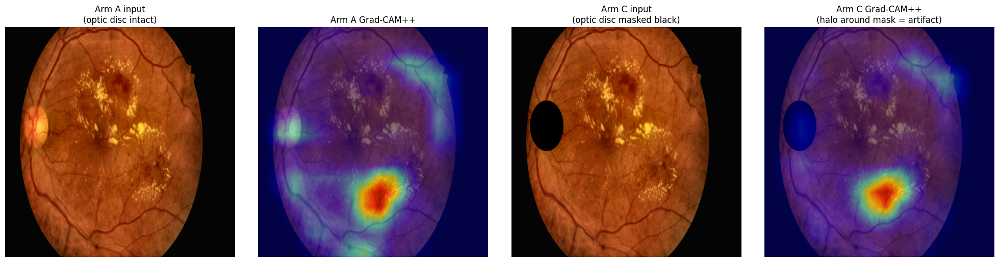

  saved /kaggle/working/armC_artifact_0.png


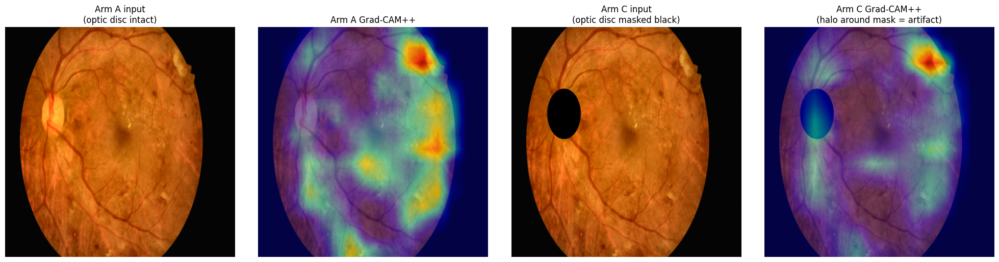

  saved /kaggle/working/armC_artifact_1.png


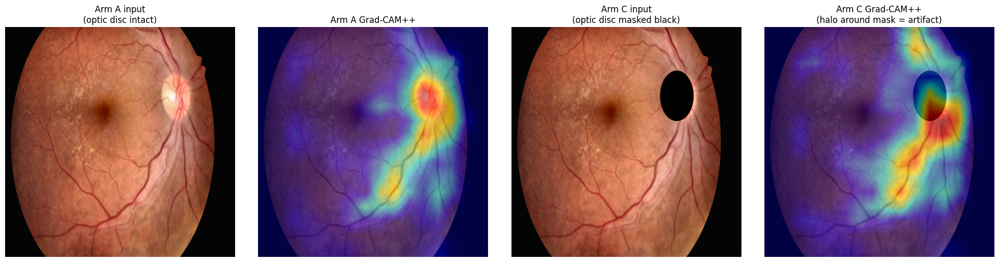

  saved /kaggle/working/armC_artifact_2.png


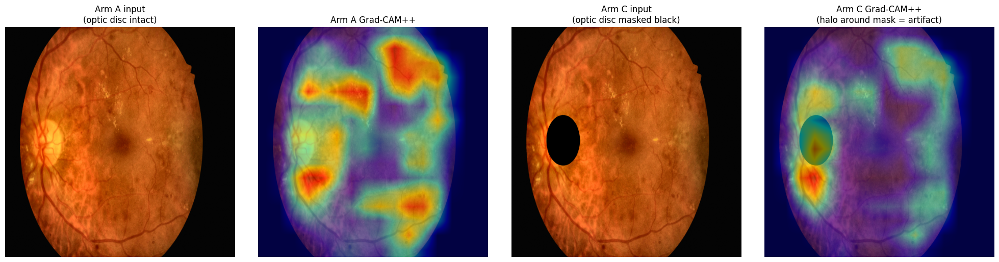

  saved /kaggle/working/armC_artifact_3.png

If a bright ring hugs the black disc in the Arm C column, the artifact
hypothesis is confirmed and these figures belong in the thesis as direct
visual evidence. If attention instead sits elsewhere, the increase in
optic-disc lift has a different cause and should be reported as unexplained.

ANALYSIS COMPLETE


In [8]:
"""
================================================================================
RQ3 ABLATION - statistical testing and visual confirmation of the artifact
================================================================================

PART 1  Paired statistical tests across the three preprocessing arms.
        The same 81 segmentation images pass through every arm, so arm
        comparisons are PAIRED - each image contributes one matched
        observation per arm. Wilcoxon signed-rank is used because IoU and
        lift values are bounded and right-skewed at this sample size.

PART 2  Visual confirmation of the Arm C backfire mechanism.
        Arm C blacked out the optic disc, yet attention over that region
        INCREASED (lift 2.70 -> 3.70). The hypothesis is that the synthetic
        black disc creates a hard high-contrast edge which the convolutional
        backbone finds more salient than the natural optic disc it replaced.
        This section renders Arm C saliency maps so the hypothesis can be
        confirmed or rejected by inspection: if attention forms a ring or
        halo around the masked circle, the artifact explanation holds.

        This matters because a mechanism you can SHOW is far stronger in a
        thesis than a number you can only assert.

Runs on saved CSVs and checkpoints. Self-contained.
"""

import os
import re
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image
from scipy.stats import wilcoxon, friedmanchisquare
from torchvision import models, transforms

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

IDRID_ROOT = os.environ.get("IDRID_ROOT", os.path.join("data", "idrid-dataset"))
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "outputs")
os.makedirs(OUTPUT_DIR, exist_ok=True)
PER_IMAGE_CSV = os.path.join(OUTPUT_DIR, "rq3_ablation_per_image.csv")
SEG_ROOT = os.path.join(IDRID_ROOT, "A. Segmentation/A. Segmentation")

IMAGE_SIZE = 512
NUM_CLASSES = 5
OD_MASK_RADIUS_FRAC = 0.11
N_VISUAL_SAMPLES = 4
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

ARM_LABELS = {
    "A": "CLAHE + FOV (baseline)",
    "B": "FOV only, no CLAHE",
    "C": "CLAHE + FOV + OD masked",
}

# ==============================================================================
# PART 1: PAIRED STATISTICAL TESTS
# ==============================================================================

df = pd.read_csv(PER_IMAGE_CSV)
print("=" * 78)
print("PART 1 - PAIRED STATISTICAL TESTS ACROSS PREPROCESSING ARMS")
print("=" * 78)

wide = df.pivot(index="seg_id", columns="arm")
print(f"Paired observations per arm: {len(wide)}")


def describe(series, label):
    s = pd.Series(series).dropna()
    sem = s.std() / np.sqrt(len(s))
    print(f"  {label:32s} mean {s.mean():.4f}  median {s.median():.4f}  "
          f"SD {s.std():.4f}  95%CI [{s.mean()-1.96*sem:.4f}, {s.mean()+1.96*sem:.4f}]")


def rank_biserial(x, y):
    d = np.array(x, dtype=float) - np.array(y, dtype=float)
    d = d[~np.isnan(d)]
    d = d[d != 0]
    return 0.0 if len(d) == 0 else (np.sum(d > 0) - np.sum(d < 0)) / len(d)


def paired(metric, arm1, arm2, claim):
    a = wide[(metric, arm1)]
    b = wide[(metric, arm2)]
    pair = pd.DataFrame({"a": a, "b": b}).dropna()
    if len(pair) < 6:
        print(f"\n{claim}\n  insufficient paired data ({len(pair)})")
        return
    stat, p = wilcoxon(pair["a"], pair["b"])
    eff = rank_biserial(pair["a"], pair["b"])
    print(f"\n{claim}")
    print(f"  arm {arm1}: {pair['a'].mean():.4f}   arm {arm2}: {pair['b'].mean():.4f}   "
          f"diff {pair['a'].mean()-pair['b'].mean():+.4f}")
    print(f"  Wilcoxon W={stat:.1f}  p={p:.4f}  n={len(pair)}  effect r={eff:+.3f}")
    sig = ("p < 0.001" if p < 0.001 else "p < 0.01" if p < 0.01
           else "p < 0.05" if p < 0.05 else "NOT SIGNIFICANT")
    mag = abs(eff)
    size = ("negligible" if mag < 0.1 else "small" if mag < 0.3
            else "moderate" if mag < 0.5 else "large")
    print(f"  -> {sig}, effect {size}")


print("\n" + "-" * 78)
print("DESCRIPTIVES - drift ratio proxy (optic-disc lift)")
print("-" * 78)
for arm in ["A", "B", "C"]:
    describe(wide[("gc_lift_od", arm)], f"arm {arm} optic-disc lift")

print("\n" + "-" * 78)
print("DESCRIPTIVES - lesion lift (the behaviour we WANT)")
print("-" * 78)
for arm in ["A", "B", "C"]:
    describe(wide[("gc_lift", arm)], f"arm {arm} lesion lift")

print("\n" + "-" * 78)
print("OMNIBUS TEST - does preprocessing affect optic-disc attention at all?")
print("-" * 78)
od_cols = [wide[("gc_lift_od", a)] for a in ["A", "B", "C"]]
od_frame = pd.DataFrame({a: c for a, c in zip("ABC", od_cols)}).dropna()
if len(od_frame) >= 6:
    stat, p = friedmanchisquare(od_frame["A"], od_frame["B"], od_frame["C"])
    print(f"  Friedman chi2 = {stat:.3f}, p = {p:.4f}, n = {len(od_frame)}")
    print(f"  -> {'arms differ significantly' if p < 0.05 else 'no significant difference across arms'}")
    print("  (Friedman is the non-parametric repeated-measures omnibus test;")
    print("   pairwise Wilcoxon tests below localise any difference it finds)")

print("\n" + "-" * 78)
print("KEY HYPOTHESIS TESTS")
print("-" * 78)

paired("gc_lift_od", "C", "A",
       "H1: masking the optic disc INCREASED attention there vs baseline\n"
       "    (if significant and positive, the mitigation backfired)")

paired("gc_lift", "C", "A",
       "H2: masking the optic disc changed lesion alignment vs baseline")

paired("gc_lift_od", "A", "B",
       "H3: CLAHE reduces optic-disc attention (A should be LOWER than B)")

paired("gc_lift", "A", "B",
       "H4: CLAHE changes lesion alignment")

print("\n" + "-" * 78)
print("REPLICATION - Grad-CAM++ vs Integrated Gradients, within each arm")
print("-" * 78)
for arm in ["A", "B", "C"]:
    pair = pd.DataFrame({"gc": wide[("gc_lift", arm)],
                         "ig": wide[("ig_lift", arm)]}).dropna()
    stat, p = wilcoxon(pair["gc"], pair["ig"])
    eff = rank_biserial(pair["gc"], pair["ig"])
    sig = "significant" if p < 0.05 else "not significant"
    print(f"  arm {arm}: Grad-CAM++ {pair['gc'].mean():.3f} vs IG {pair['ig'].mean():.3f}  "
          f"p={p:.4f} ({sig}), effect r={eff:+.3f}")
print("  Consistency of direction across three independently trained models is")
print("  stronger evidence than any single arm's p-value.")


# ==============================================================================
# PART 2: VISUAL CONFIRMATION OF THE ARM C ARTIFACT
# ==============================================================================

print("\n\n" + "=" * 78)
print("PART 2 - VISUAL CONFIRMATION OF THE ARM C BACKFIRE MECHANISM")
print("=" * 78)

ARM_C_CKPT = os.path.join(OUTPUT_DIR, "model_arm_C.pth")
ARM_A_CKPT = os.path.join(OUTPUT_DIR, "model_arm_A.pth")

if not (os.path.exists(ARM_C_CKPT) and os.path.exists(ARM_A_CKPT)):
    print("Arm A or C checkpoint missing - skipping visual confirmation.")
    print("Rerun the ablation script to regenerate them.")
else:
    def apply_clahe(img, clip=2.0, tile=(8, 8)):
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        return cv2.cvtColor(cv2.merge((cv2.createCLAHE(clip, tile).apply(l), a, b)),
                            cv2.COLOR_LAB2BGR)

    def fov_mask(img, thr=10):
        g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        _, t = cv2.threshold(g, thr, 255, cv2.THRESH_BINARY)
        cs, _ = cv2.findContours(t, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not cs:
            return img
        m = np.zeros_like(g)
        cv2.drawContours(m, [max(cs, key=cv2.contourArea)], -1, 255, cv2.FILLED)
        return cv2.bitwise_and(img, img, mask=m)

    def detect_od(img, frac=OD_MASK_RADIUS_FRAC):
        g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        h, w = g.shape
        r = int(min(h, w) * frac)
        k = max(3, (r | 1))
        _, _, _, loc = cv2.minMaxLoc(cv2.GaussianBlur(g, (k, k), 0))
        return loc, r

    def preprocess(path, arm):
        img = cv2.imread(str(path))
        img = fov_mask(img)
        if arm in ("A", "C"):
            img = apply_clahe(img)
        if arm == "C":
            c, r = detect_od(img)
            cv2.circle(img, c, r, (0, 0, 0), -1)
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    def load_model(ckpt):
        m = models.efficientnet_b0(weights=None)
        nf = m.classifier[1].in_features
        m.classifier = nn.Sequential(nn.Dropout(0.3), nn.Linear(nf, NUM_CLASSES))
        m.load_state_dict(torch.load(ckpt, map_location=DEVICE))
        return m.to(DEVICE).eval()

    def gradcam(model, tensor, cls):
        inp = tensor.unsqueeze(0).clone().detach().requires_grad_(True)
        with GradCAMPlusPlus(model=model, target_layers=[model.features[-1]]) as cam:
            return cam(input_tensor=inp, targets=[ClassifierOutputTarget(cls)])[0]

    eval_tf = transforms.Compose([transforms.ToTensor(),
                                  transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

    seg_test_dir = os.path.join(SEG_ROOT, "1. Original Images/b. Testing Set")
    sample_files = sorted(os.listdir(seg_test_dir))[:N_VISUAL_SAMPLES]

    model_a = load_model(ARM_A_CKPT)
    model_c = load_model(ARM_C_CKPT)

    print(f"Rendering {len(sample_files)} side-by-side comparisons (Arm A vs Arm C)")
    print("LOOK FOR: in the Arm C column, does attention form a ring or halo")
    print("around the black disc? That is the artifact-edge signature.\n")

    for i, fname in enumerate(sample_files):
        path = os.path.join(seg_test_dir, fname)

        rgb_a = preprocess(path, "A")
        rgb_c = preprocess(path, "C")
        t_a = eval_tf(Image.fromarray(rgb_a))
        t_c = eval_tf(Image.fromarray(rgb_c))

        with torch.no_grad():
            pred_a = model_a(t_a.unsqueeze(0).to(DEVICE)).argmax(1).item()
            pred_c = model_c(t_c.unsqueeze(0).to(DEVICE)).argmax(1).item()

        cam_a = gradcam(model_a, t_a.to(DEVICE), pred_a)
        cam_c = gradcam(model_c, t_c.to(DEVICE), pred_c)

        fig, ax = plt.subplots(1, 4, figsize=(20, 5))
        ax[0].imshow(rgb_a / 255.0 if rgb_a.max() > 1 else rgb_a)
        ax[0].set_title("Arm A input\n(optic disc intact)")
        ax[1].imshow(show_cam_on_image(rgb_a.astype(np.float32) / 255.0, cam_a, use_rgb=True))
        ax[1].set_title("Arm A Grad-CAM++")
        ax[2].imshow(rgb_c / 255.0 if rgb_c.max() > 1 else rgb_c)
        ax[2].set_title("Arm C input\n(optic disc masked black)")
        ax[3].imshow(show_cam_on_image(rgb_c.astype(np.float32) / 255.0, cam_c, use_rgb=True))
        ax[3].set_title("Arm C Grad-CAM++\n(halo around mask = artifact)")
        for a in ax:
            a.axis("off")
        plt.tight_layout()
        out = os.path.join(OUTPUT_DIR, f"armC_artifact_{i}.png")
        plt.savefig(out, dpi=110, bbox_inches="tight")
        plt.show()
        plt.close(fig)
        print(f"  saved {out}")
        torch.cuda.empty_cache()

    print("\nIf a bright ring hugs the black disc in the Arm C column, the artifact")
    print("hypothesis is confirmed and these figures belong in the thesis as direct")
    print("visual evidence. If attention instead sits elsewhere, the increase in")
    print("optic-disc lift has a different cause and should be reported as unexplained.")

print("\n" + "=" * 78)
print("ANALYSIS COMPLETE")
print("=" * 78)

In [9]:
"""
================================================================================
ARM C MECHANISM DIAGNOSTIC
Distinguishing "imprecise mask" from "artifact attraction"
================================================================================

THE PROBLEM THIS RESOLVES:

Arm C masked the optic disc with a black circle and optic-disc attention lift
ROSE from 2.70 to 3.70 (p < 0.001, large effect). Two very different
explanations fit that statistic:

  EXPLANATION 1 - ARTIFACT ATTRACTION (the interesting one)
    The synthetic black disc creates a hard high-contrast edge that the
    convolutional backbone finds more salient than the natural optic disc.
    The mitigation genuinely backfires, and the lesson generalises: masking
    a confounder can introduce a stronger one.

  EXPLANATION 2 - IMPRECISE MASK (the mundane one)
    The automated detector scored only IoU 0.56 against ground-truth optic
    disc masks, so roughly 40% of the true disc was never covered. The model
    may simply be attending to the bright OD tissue still visible, while the
    metric scores that against the FULL ground-truth mask. Nothing surprising
    happens - the mask was just badly placed.

Visual inspection of four samples did NOT show the halo predicted by
Explanation 1. In two samples the black disc was cold (ignored), and in the
other two the warmth sat on residual uncovered OD tissue rather than on the
mask boundary. That points toward Explanation 2, but four images is not
evidence. This script decides it quantitatively across all 81.

THE TEST:
Partition each ground-truth optic disc mask into two disjoint regions:

    COVERED   = ground-truth OD  AND      black circle   (blacked out)
    RESIDUAL  = ground-truth OD  AND NOT  black circle   (still visible)

Then measure Grad-CAM++ attention lift on each region separately, against
each region's own chance floor.

    lift(RESIDUAL) >> lift(COVERED)  -> Explanation 2, imprecise mask
    lift(COVERED)  >> lift(RESIDUAL) -> Explanation 1, artifact attraction
    both similar / both low          -> neither; report as unexplained

Requires model_arm_C.pth. Self-contained otherwise.
================================================================================
"""

import os
import re
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from PIL import Image
from scipy.stats import wilcoxon
from torchvision import models, transforms

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

IDRID_ROOT = os.environ.get("IDRID_ROOT", os.path.join("data", "idrid-dataset"))
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "outputs")
os.makedirs(OUTPUT_DIR, exist_ok=True)
SEG_ROOT = os.path.join(IDRID_ROOT, "A. Segmentation/A. Segmentation")
SEG_SPLITS = {
    "seg_train": (os.path.join(SEG_ROOT, "1. Original Images/a. Training Set"),
                  os.path.join(SEG_ROOT, "2. All Segmentation Groundtruths/a. Training Set")),
    "seg_test": (os.path.join(SEG_ROOT, "1. Original Images/b. Testing Set"),
                 os.path.join(SEG_ROOT, "2. All Segmentation Groundtruths/b. Testing Set")),
}
OPTIC_DISC_SUBFOLDER = "5. Optic Disc"
ARM_C_CKPT = os.path.join(OUTPUT_DIR, "model_arm_C.pth")

IMAGE_SIZE = 512
NUM_CLASSES = 5
PERCENTILE = 75
N_RANDOM_TRIALS = 20
OD_MASK_RADIUS_FRAC = 0.11
MIN_REGION_PIXELS = 200   # skip regions too small for a stable IoU

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

eval_tf = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])


# ---------------------------------------------------------------- preprocessing

def apply_clahe(img, clip=2.0, tile=(8, 8)):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    return cv2.cvtColor(cv2.merge((cv2.createCLAHE(clip, tile).apply(l), a, b)),
                        cv2.COLOR_LAB2BGR)


def fov_mask(img, thr=10):
    g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, t = cv2.threshold(g, thr, 255, cv2.THRESH_BINARY)
    cs, _ = cv2.findContours(t, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cs:
        return img
    m = np.zeros_like(g)
    cv2.drawContours(m, [max(cs, key=cv2.contourArea)], -1, 255, cv2.FILLED)
    return cv2.bitwise_and(img, img, mask=m)


def detect_od(img, frac=OD_MASK_RADIUS_FRAC):
    g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = g.shape
    r = int(min(h, w) * frac)
    k = max(3, (r | 1))
    _, _, _, loc = cv2.minMaxLoc(cv2.GaussianBlur(g, (k, k), 0))
    return loc, r


def preprocess_arm_c(path):
    """Returns the Arm C input image AND the black-circle mask at model
    resolution, so we know exactly which pixels were blacked out."""
    img = cv2.imread(str(path))
    img = fov_mask(img)
    img = apply_clahe(img)

    center, radius = detect_od(img)
    h, w = img.shape[:2]
    circle_full = np.zeros((h, w), dtype=np.uint8)
    cv2.circle(circle_full, center, radius, 1, thickness=-1)
    cv2.circle(img, center, radius, (0, 0, 0), thickness=-1)

    img_r = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)
    circle_r = (cv2.resize(circle_full, (IMAGE_SIZE, IMAGE_SIZE),
                           interpolation=cv2.INTER_NEAREST) > 0).astype(np.uint8)
    return cv2.cvtColor(img_r, cv2.COLOR_BGR2RGB), circle_r


def extract_numeric_id(fn):
    m = re.search(r"IDRiD_0*(\d+)", str(fn))
    return int(m.group(1)) if m else None


def load_binary_mask(path, size=IMAGE_SIZE):
    if path is None:
        return np.zeros((size, size), dtype=np.uint8)
    m = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if m is None:
        return np.zeros((size, size), dtype=np.uint8)
    return (cv2.resize(m, (size, size), interpolation=cv2.INTER_NEAREST) > 0).astype(np.uint8)


# ---------------------------------------------------------------------- metrics

def iou(a, b):
    u = np.logical_or(a, b).sum()
    return np.nan if u == 0 else np.logical_and(a, b).sum() / u


def chance_iou(mask, n_att, trials=N_RANDOM_TRIALS):
    h, w = mask.shape
    tot = h * w
    vals = []
    for _ in range(trials):
        f = np.zeros(tot, dtype=np.uint8)
        f[np.random.choice(tot, size=int(n_att), replace=False)] = 1
        vals.append(iou(f.reshape(h, w), mask))
    return np.nanmean(vals)


def binarize(m, pct=PERCENTILE):
    return (m >= np.percentile(m, pct)).astype(np.uint8)


def gradcam(model, tensor, cls):
    inp = tensor.unsqueeze(0).clone().detach().requires_grad_(True)
    with GradCAMPlusPlus(model=model, target_layers=[model.features[-1]]) as cam:
        return cam(input_tensor=inp, targets=[ClassifierOutputTarget(cls)])[0]


# ------------------------------------------------------------------------- main

print("=" * 78)
print("ARM C MECHANISM DIAGNOSTIC")
print("=" * 78)

if not os.path.exists(ARM_C_CKPT):
    raise SystemExit(f"Missing {ARM_C_CKPT} - rerun the ablation script first.")

model = models.efficientnet_b0(weights=None)
nf = model.classifier[1].in_features
model.classifier = nn.Sequential(nn.Dropout(0.3), nn.Linear(nf, NUM_CLASSES))
model.load_state_dict(torch.load(ARM_C_CKPT, map_location=DEVICE))
model = model.to(DEVICE).eval()

records = []
for split_name, (img_dir, mask_root) in SEG_SPLITS.items():
    od_dir = os.path.join(mask_root, OPTIC_DISC_SUBFOLDER)
    if not os.path.isdir(od_dir):
        continue
    for f in sorted(os.listdir(img_dir)):
        nid = extract_numeric_id(f)
        if nid is None:
            continue
        hits = [x for x in os.listdir(od_dir) if extract_numeric_id(x) == nid]
        if hits:
            records.append({"seg_id": f"IDRiD_{nid:02d}",
                            "image_path": os.path.join(img_dir, f),
                            "od_mask_path": os.path.join(od_dir, hits[0])})

manifest = pd.DataFrame(records)
print(f"Images with ground-truth optic disc masks: {len(manifest)}")

rows = []
for i, (_, r) in enumerate(manifest.iterrows(), 1):
    if i % 25 == 0:
        print(f"  {i}/{len(manifest)}")

    rgb, circle = preprocess_arm_c(r["image_path"])
    true_od = load_binary_mask(r["od_mask_path"])

    covered = np.logical_and(true_od, circle).astype(np.uint8)
    residual = np.logical_and(true_od, np.logical_not(circle)).astype(np.uint8)

    if covered.sum() < MIN_REGION_PIXELS or residual.sum() < MIN_REGION_PIXELS:
        # one region too small to score reliably - skip rather than report noise
        continue

    t = eval_tf(Image.fromarray(rgb))
    with torch.no_grad():
        pred = model(t.unsqueeze(0).to(DEVICE)).argmax(1).item()

    att = binarize(gradcam(model, t.to(DEVICE), pred))
    n_att = att.sum()

    iou_cov, iou_res = iou(att, covered), iou(att, residual)
    ch_cov, ch_res = chance_iou(covered, n_att), chance_iou(residual, n_att)

    rows.append({
        "seg_id": r["seg_id"],
        "covered_px": int(covered.sum()),
        "residual_px": int(residual.sum()),
        "coverage_frac": round(covered.sum() / max(true_od.sum(), 1), 3),
        "lift_covered": iou_cov / ch_cov if ch_cov else np.nan,
        "lift_residual": iou_res / ch_res if ch_res else np.nan,
    })
    torch.cuda.empty_cache()

res = pd.DataFrame(rows)
res.to_csv(os.path.join(OUTPUT_DIR, "armC_mechanism_diagnostic.csv"), index=False)

print("\n" + "=" * 78)
print("RESULTS")
print("=" * 78)
print(f"Images scored (both regions large enough): {len(res)}")
print(f"Mean fraction of true optic disc actually blacked out: "
      f"{res['coverage_frac'].mean():.3f}")

lc, lr = res["lift_covered"].dropna(), res["lift_residual"].dropna()
print(f"\n  attention lift on COVERED  (blacked-out) region: {lc.mean():.3f}  "
      f"median {lc.median():.3f}  SD {lc.std():.3f}")
print(f"  attention lift on RESIDUAL (still visible) region: {lr.mean():.3f}  "
      f"median {lr.median():.3f}  SD {lr.std():.3f}")

pair = res[["lift_covered", "lift_residual"]].dropna()
if len(pair) >= 6:
    stat, p = wilcoxon(pair["lift_residual"], pair["lift_covered"])
    d = np.array(pair["lift_residual"]) - np.array(pair["lift_covered"])
    d = d[d != 0]
    eff = (np.sum(d > 0) - np.sum(d < 0)) / len(d) if len(d) else 0.0
    print(f"\n  Wilcoxon (residual vs covered): W={stat:.1f}  p={p:.4f}  "
          f"n={len(pair)}  effect r={eff:+.3f}")

print("\n" + "-" * 78)
print("VERDICT")
print("-" * 78)

ratio = lr.mean() / lc.mean() if lc.mean() else np.nan
if np.isnan(ratio):
    print("  Could not compute - insufficient data.")
elif ratio > 1.3:
    print(f"  Residual/covered lift ratio = {ratio:.2f}")
    print("  -> EXPLANATION 2 SUPPORTED: attention concentrates on optic disc")
    print("     tissue the mask FAILED to cover. Arm C's increase reflects an")
    print("     imprecise automated mask, not artifact attraction.")
    print("     Report as a methodological limitation. The honest claim is that")
    print("     the mitigation was not adequately implemented, so RQ3's optic")
    print("     disc component remains untested rather than answered negatively.")
elif ratio < 0.77:
    print(f"  Residual/covered lift ratio = {ratio:.2f}")
    print("  -> EXPLANATION 1 SUPPORTED: attention concentrates on the BLACKED-OUT")
    print("     region itself. The synthetic mask genuinely attracts attention.")
    print("     The backfire finding stands and is a real contribution.")
else:
    print(f"  Residual/covered lift ratio = {ratio:.2f}")
    print("  -> NEITHER explanation clearly supported. Attention is distributed")
    print("     across both regions similarly. Report the Arm C increase as")
    print("     observed but mechanistically unexplained - which is an honest")
    print("     and acceptable thesis outcome.")

print(f"\nSaved: {os.path.join(OUTPUT_DIR, 'armC_mechanism_diagnostic.csv')}")
print("=" * 78)

ARM C MECHANISM DIAGNOSTIC
Images with ground-truth optic disc masks: 81
  25/81
  50/81
  75/81

RESULTS
Images scored (both regions large enough): 60
Mean fraction of true optic disc actually blacked out: 0.859

  attention lift on COVERED  (blacked-out) region: 3.839  median 4.149  SD 0.749
  attention lift on RESIDUAL (still visible) region: 3.277  median 3.938  SD 1.287

  Wilcoxon (residual vs covered): W=47.0  p=0.0000  n=60  effect r=-0.900

------------------------------------------------------------------------------
VERDICT
------------------------------------------------------------------------------
  Residual/covered lift ratio = 0.85
  -> NEITHER explanation clearly supported. Attention is distributed
     across both regions similarly. Report the Arm C increase as
     observed but mechanistically unexplained - which is an honest
     and acceptable thesis outcome.

Saved: /kaggle/working/armC_mechanism_diagnostic.csv
